### Import Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')
plt.rcParams['figure.figsize']=[15,8]

### Set Options

In [2]:
pd.options.display.max_columns = None
pd.options.display.max_rows = None

pd.options.display.float_format = '{:.6f}'.format

### Read data

In [3]:
df = pd.read_csv('cell2celltrain.csv')
df.head()

,CustomerID,Churn,MonthlyRevenue,MonthlyMinutes,TotalRecurringCharge,DirectorAssistedCalls,OverageMinutes,RoamingCalls,PercChangeMinutes,PercChangeRevenues,DroppedCalls,BlockedCalls,UnansweredCalls,CustomerCareCalls,ThreewayCalls,ReceivedCalls,OutboundCalls,InboundCalls,PeakCallsInOut,OffPeakCallsInOut,DroppedBlockedCalls,CallForwardingCalls,CallWaitingCalls,MonthsInService,UniqueSubs,ActiveSubs,ServiceArea,Handsets,HandsetModels,CurrentEquipmentDays,AgeHH1,AgeHH2,ChildrenInHH,HandsetRefurbished,HandsetWebCapable,TruckOwner,RVOwner,Homeownership,BuysViaMailOrder,RespondsToMailOffers,OptOutMailings,NonUSTravel,OwnsComputer,HasCreditCard,RetentionCalls,RetentionOffersAccepted,NewCellphoneUser,NotNewCellphoneUser,ReferralsMadeBySubscriber,IncomeGroup,OwnsMotorcycle,AdjustmentsToCreditRating,HandsetPrice,MadeCallToRetentionTeam,CreditRating,PrizmCode,Occupation,MaritalStatus
0,3000002,Yes,24.000000,219.000000,22.000000,0.250000,0.000000,0.000000,-157.000000,-19.000000,0.700000,0.700000,6.300000,0.000000,0.000000,97.200000,0.000000,0.000000,58.000000,24.000000,1.300000,0.000000,0.300000,61,2,1,SEAPOR503,2.000000,2.000000,361.000000,62.000000,0.000000,No,No,Yes,No,No,Known,Yes,Yes,No,No,Yes,Yes,1,0,No,No,0,4,No,0,30,Yes,1-Highest,Suburban,Professional,No
1,3000010,Yes,16.990000,10.000000,17.000000,0.000000,0.000000,0.000000,-4.000000,0.000000,0.300000,0.000000,2.700000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,1.000000,0.300000,0.000000,0.000000,58,1,1,PITHOM412,2.000000,1.000000,1504.000000,40.000000,42.000000,Yes,No,No,No,No,Known,Yes,Yes,No,No,Yes,Yes,0,0,Yes,No,0,5,No,0,30,No,4-Medium,Suburban,Professional,Yes
2,3000014,No,38.000000,8.000000,38.000000,0.000000,0.000000,0.000000,-2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.400000,0.300000,0.000000,1.300000,3.700000,0.000000,0.000000,0.000000,60,1,1,MILMIL414,1.000000,1.000000,1812.000000,26.000000,26.000000,Yes,No,No,No,No,Unknown,No,No,No,No,No,Yes,0,0,Yes,No,0,6,No,0,Unknown,No,3-Good,Town,Crafts,Yes
3,3000022,No,82.280000,1312.000000,75.000000,1.240000,0.000000,0.000000,157.000000,8.100000,52.000000,7.700000,76.000000,4.300000,1.300000,200.300000,370.300000,147.000000,555.700000,303.700000,59.700000,0.000000,22.700000,59,2,2,PITHOM412,9.000000,4.000000,458.000000,30.000000,0.000000,No,No,Yes,No,No,Known,Yes,Yes,No,No,No,Yes,0,0,Yes,No,0,6,No,0,10,No,4-Medium,Other,Other,No
4,3000026,Yes,17.140000,0.000000,17.000000,0.000000,0.000000,0.000000,0.000000,-0.200000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,53,2,2,OKCTUL918,4.000000,3.000000,852.000000,46.000000,54.000000,No,No,No,No,No,Known,Yes,Yes,No,No,Yes,Yes,0,0,No,Yes,0,9,No,1,10,No,1-Highest,Other,Professional,Yes


## Data Analysis and Preparation

### Data Dimension

In [4]:
df.shape

(51047, 58)

- There are 51047 rows and 58 columns in the dataset.

### Check the datatypes

In [5]:
df.dtypes

CustomerID                     int64
Churn                         object
MonthlyRevenue               float64
MonthlyMinutes               float64
TotalRecurringCharge         float64
DirectorAssistedCalls        float64
OverageMinutes               float64
RoamingCalls                 float64
PercChangeMinutes            float64
PercChangeRevenues           float64
DroppedCalls                 float64
BlockedCalls                 float64
UnansweredCalls              float64
CustomerCareCalls            float64
ThreewayCalls                float64
ReceivedCalls                float64
OutboundCalls                float64
InboundCalls                 float64
PeakCallsInOut               float64
OffPeakCallsInOut            float64
DroppedBlockedCalls          float64
CallForwardingCalls          float64
CallWaitingCalls             float64
MonthsInService                int64
UniqueSubs                     int64
ActiveSubs                     int64
ServiceArea                   object
H

- All the datatypes are assigned correctly except the first one. CustomerID should be a categorical column since no mathematical operation can be done.

In [6]:
df.CustomerID = df.CustomerID.astype('object')

### Checking the info of the dataframe

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51047 entries, 0 to 51046
Data columns (total 58 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   CustomerID                 51047 non-null  object 
 1   Churn                      51047 non-null  object 
 2   MonthlyRevenue             50891 non-null  float64
 3   MonthlyMinutes             50891 non-null  float64
 4   TotalRecurringCharge       50891 non-null  float64
 5   DirectorAssistedCalls      50891 non-null  float64
 6   OverageMinutes             50891 non-null  float64
 7   RoamingCalls               50891 non-null  float64
 8   PercChangeMinutes          50680 non-null  float64
 9   PercChangeRevenues         50680 non-null  float64
 10  DroppedCalls               51047 non-null  float64
 11  BlockedCalls               51047 non-null  float64
 12  UnansweredCalls            51047 non-null  float64
 13  CustomerCareCalls          51047 non-null  flo

### Summary Statistics

In [8]:
df.describe()

,MonthlyRevenue,MonthlyMinutes,TotalRecurringCharge,DirectorAssistedCalls,OverageMinutes,RoamingCalls,PercChangeMinutes,PercChangeRevenues,DroppedCalls,BlockedCalls,UnansweredCalls,CustomerCareCalls,ThreewayCalls,ReceivedCalls,OutboundCalls,InboundCalls,PeakCallsInOut,OffPeakCallsInOut,DroppedBlockedCalls,CallForwardingCalls,CallWaitingCalls,MonthsInService,UniqueSubs,ActiveSubs,Handsets,HandsetModels,CurrentEquipmentDays,AgeHH1,AgeHH2,RetentionCalls,RetentionOffersAccepted,ReferralsMadeBySubscriber,IncomeGroup,AdjustmentsToCreditRating
count,50891.000000,50891.000000,50891.000000,50891.000000,50891.000000,50891.000000,50680.000000,50680.000000,51047.000000,51047.000000,51047.000000,51047.000000,51047.000000,51047.000000,51047.000000,51047.000000,51047.000000,51047.000000,51047.000000,51047.000000,51047.000000,51047.000000,51047.000000,51047.000000,51046.000000,51046.000000,51046.000000,50138.000000,50138.000000,51047.000000,51047.000000,51047.000000,51047.000000,51047.000000
mean,58.834492,525.653416,46.830088,0.895229,40.027785,1.236244,-11.547908,-1.191985,6.011489,4.085672,28.288981,1.868999,0.298838,114.800121,25.377715,8.178104,90.549515,67.650790,10.158003,0.012277,1.840504,18.756264,1.532157,1.354340,1.805646,1.558751,380.545841,31.338127,21.144142,0.037201,0.018277,0.052070,4.324524,0.053911
std,44.507336,529.871063,23.848871,2.228546,96.588076,9.818294,257.514772,39.574915,9.043955,10.946905,38.876194,5.096138,1.168277,166.485896,35.209147,16.665878,104.947470,92.752699,15.555284,0.594168,5.585129,9.800138,1.223384,0.675477,1.331173,0.905932,253.801982,22.094635,23.931368,0.206483,0.142458,0.307592,3.138236,0.383147
min,-6.170000,0.000000,-11.000000,0.000000,0.000000,0.000000,-3875.000000,-1107.700000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,1.000000,0.000000,1.000000,1.000000,-5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,33.610000,158.000000,30.000000,0.000000,0.000000,0.000000,-83.000000,-7.100000,0.700000,0.000000,5.300000,0.000000,0.000000,8.300000,3.300000,0.000000,23.000000,11.000000,1.700000,0.000000,0.000000,11.000000,1.000000,1.000000,1.000000,1.000000,205.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,48.460000,366.000000,45.000000,0.250000,3.000000,0.000000,-5.000000,-0.300000,3.000000,1.000000,16.300000,0.000000,0.000000,52.800000,13.700000,2.000000,62.000000,35.700000,5.300000,0.000000,0.300000,16.000000,1.000000,1.000000,1.000000,1.000000,329.000000,36.000000,0.000000,0.000000,0.000000,0.000000,5.000000,0.000000
75%,71.065000,723.000000,60.000000,0.990000,41.000000,0.300000,66.000000,1.600000,7.700000,3.700000,36.300000,1.700000,0.300000,153.500000,34.000000,9.300000,121.300000,88.700000,12.300000,0.000000,1.300000,24.000000,2.000000,2.000000,2.000000,2.000000,515.000000,48.000000,42.000000,0.000000,0.000000,0.000000,7.000000,0.000000
max,1223.380000,7359.000000,400.000000,159.390000,4321.000000,1112.400000,5192.000000,2483.500000,221.700000,384.300000,848.700000,327.300000,66.000000,2692.400000,644.300000,519.300000,2090.700000,1474.700000,411.700000,81.300000,212.700000,61.000000,196.000000,53.000000,24.000000,15.000000,1812.000000,99.000000,99.000000,4.000000,3.000000,35.000000,9.000000,25.000000


**Inference:**

- We are having the negative values in the dataset, Monthly revenue is in Negative which cannot be true. 
- There a huge difference between our mean value and the maximum value, which means there are potential outliers in the data.
- In PercChangeMinutes column, we have our mean value also in negative terms.

In [9]:
df.describe(include = object)

,CustomerID,Churn,ServiceArea,ChildrenInHH,HandsetRefurbished,HandsetWebCapable,TruckOwner,RVOwner,Homeownership,BuysViaMailOrder,RespondsToMailOffers,OptOutMailings,NonUSTravel,OwnsComputer,HasCreditCard,NewCellphoneUser,NotNewCellphoneUser,OwnsMotorcycle,HandsetPrice,MadeCallToRetentionTeam,CreditRating,PrizmCode,Occupation,MaritalStatus
count,51047,51047,51023,51047,51047,51047,51047,51047,51047,51047,51047,51047,51047,51047,51047,51047,51047,51047,51047,51047,51047,51047,51047,51047
unique,51047,2,747,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,16,2,7,4,8,3
top,3000002,No,NYCBRO917,No,No,Yes,No,No,Known,No,No,No,No,No,Yes,No,No,No,Unknown,No,2-High,Other,Other,Unknown
freq,1,36336,1684,38679,43956,46046,41524,46894,33987,32596,31821,50295,48168,41583,34503,41223,44012,50368,28982,49302,18993,24655,37637,19700


**Inference:**

- ServiceArea - NYCBRO917, has is the most repeated value in that column. 
- All the other variables except HandsetWebCapable, HasCreditCard has the highest frequency as no.
- The same can be visualized below using the relationship between the target variable and the categorical variable.

### Duplicates

In [58]:
df[df.duplicated()]

,CustomerID,Churn,MonthlyRevenue,MonthlyMinutes,TotalRecurringCharge,DirectorAssistedCalls,OverageMinutes,RoamingCalls,PercChangeMinutes,PercChangeRevenues,DroppedCalls,BlockedCalls,UnansweredCalls,CustomerCareCalls,ThreewayCalls,ReceivedCalls,OutboundCalls,InboundCalls,PeakCallsInOut,OffPeakCallsInOut,DroppedBlockedCalls,CallForwardingCalls,CallWaitingCalls,MonthsInService,UniqueSubs,ActiveSubs,ServiceArea,Handsets,HandsetModels,CurrentEquipmentDays,AgeHH1,AgeHH2,ChildrenInHH,HandsetRefurbished,HandsetWebCapable,TruckOwner,RVOwner,Homeownership,BuysViaMailOrder,RespondsToMailOffers,OptOutMailings,NonUSTravel,OwnsComputer,HasCreditCard,RetentionCalls,RetentionOffersAccepted,NewCellphoneUser,NotNewCellphoneUser,ReferralsMadeBySubscriber,IncomeGroup,OwnsMotorcycle,AdjustmentsToCreditRating,MadeCallToRetentionTeam,CreditRating,PrizmCode,Occupation,MaritalStatus


In [59]:
# There are no duplicate values in the data.

### Missing Values

In [10]:
Total = df.isnull().sum().sort_values(ascending=False) 
Percent = (df.isnull().sum()*100/df.isnull().count()).sort_values(ascending=False)   
missing_data = pd.concat([Total, Percent], axis = 1, keys = ['Total', 'Percentage of Missing Values'])

missing_data

,Total,Percentage of Missing Values
AgeHH2,909,1.780712
AgeHH1,909,1.780712
PercChangeMinutes,367,0.718945
PercChangeRevenues,367,0.718945
MonthlyRevenue,156,0.305601
MonthlyMinutes,156,0.305601
TotalRecurringCharge,156,0.305601
DirectorAssistedCalls,156,0.305601
OverageMinutes,156,0.305601
RoamingCalls,156,0.305601


In [11]:
mis_index = missing_data[missing_data['Total']>0].index
mis_index

Index(['AgeHH2', 'AgeHH1', 'PercChangeMinutes', 'PercChangeRevenues',
       'MonthlyRevenue', 'MonthlyMinutes', 'TotalRecurringCharge',
       'DirectorAssistedCalls', 'OverageMinutes', 'RoamingCalls',
       'ServiceArea', 'CurrentEquipmentDays', 'Handsets', 'HandsetModels'],
      dtype='object')

- In the above columns we have missing data. There are only very few null values in the dataset. Either we can drop the null values or replace them with mean/median/mode.

- Almost all the columns are numerical except the `ServiceArea`. We can replace them median value and the ServiceArea column with mode value.

In [12]:
# Replacing the missing from the numerical columns

df[['AgeHH2', 'AgeHH1', 'PercChangeMinutes', 'PercChangeRevenues',
   'MonthlyRevenue', 'MonthlyMinutes', 'TotalRecurringCharge',
   'DirectorAssistedCalls', 'OverageMinutes', 'RoamingCalls', 'Handsets', 'HandsetModels','CurrentEquipmentDays']] = df[['AgeHH2', 'AgeHH1', 'PercChangeMinutes', 'PercChangeRevenues',
   'MonthlyRevenue', 'MonthlyMinutes', 'TotalRecurringCharge',
   'DirectorAssistedCalls', 'OverageMinutes', 'RoamingCalls', 'Handsets', 'HandsetModels','CurrentEquipmentDays']].fillna(df[['AgeHH2', 'AgeHH1', 'PercChangeMinutes', 'PercChangeRevenues',
   'MonthlyRevenue', 'MonthlyMinutes', 'TotalRecurringCharge',
   'DirectorAssistedCalls', 'OverageMinutes', 'RoamingCalls', 'Handsets', 'HandsetModels','CurrentEquipmentDays']].median())

In [13]:
# Replacing the null values from categorical columns.

df['ServiceArea'] = df['ServiceArea'].fillna(df['ServiceArea'].ffill())

In [14]:
Total = df.isnull().sum().sort_values(ascending=False) 
Percent = (df.isnull().sum()*100/df.isnull().count()).sort_values(ascending=False)   
missing_data = pd.concat([Total, Percent], axis = 1, keys = ['Total', 'Percentage of Missing Values'])

missing_data

,Total,Percentage of Missing Values
CustomerID,0,0.000000
HasCreditCard,0,0.000000
AgeHH2,0,0.000000
ChildrenInHH,0,0.000000
HandsetRefurbished,0,0.000000
HandsetWebCapable,0,0.000000
TruckOwner,0,0.000000
RVOwner,0,0.000000
Homeownership,0,0.000000
BuysViaMailOrder,0,0.000000


In [15]:
#Hereby all the missing values has been replaced.

- Lets divide the data into numerical and categorical datasets, so that it becomes easy to sort the numerical and categorical values separately.

In [16]:
df_num = df.select_dtypes(include = [np.number])
df_num.head()

,MonthlyRevenue,MonthlyMinutes,TotalRecurringCharge,DirectorAssistedCalls,OverageMinutes,RoamingCalls,PercChangeMinutes,PercChangeRevenues,DroppedCalls,BlockedCalls,UnansweredCalls,CustomerCareCalls,ThreewayCalls,ReceivedCalls,OutboundCalls,InboundCalls,PeakCallsInOut,OffPeakCallsInOut,DroppedBlockedCalls,CallForwardingCalls,CallWaitingCalls,MonthsInService,UniqueSubs,ActiveSubs,Handsets,HandsetModels,CurrentEquipmentDays,AgeHH1,AgeHH2,RetentionCalls,RetentionOffersAccepted,ReferralsMadeBySubscriber,IncomeGroup,AdjustmentsToCreditRating
0,24.000000,219.000000,22.000000,0.250000,0.000000,0.000000,-157.000000,-19.000000,0.700000,0.700000,6.300000,0.000000,0.000000,97.200000,0.000000,0.000000,58.000000,24.000000,1.300000,0.000000,0.300000,61,2,1,2.000000,2.000000,361.000000,62.000000,0.000000,1,0,0,4,0
1,16.990000,10.000000,17.000000,0.000000,0.000000,0.000000,-4.000000,0.000000,0.300000,0.000000,2.700000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,1.000000,0.300000,0.000000,0.000000,58,1,1,2.000000,1.000000,1504.000000,40.000000,42.000000,0,0,0,5,0
2,38.000000,8.000000,38.000000,0.000000,0.000000,0.000000,-2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.400000,0.300000,0.000000,1.300000,3.700000,0.000000,0.000000,0.000000,60,1,1,1.000000,1.000000,1812.000000,26.000000,26.000000,0,0,0,6,0
3,82.280000,1312.000000,75.000000,1.240000,0.000000,0.000000,157.000000,8.100000,52.000000,7.700000,76.000000,4.300000,1.300000,200.300000,370.300000,147.000000,555.700000,303.700000,59.700000,0.000000,22.700000,59,2,2,9.000000,4.000000,458.000000,30.000000,0.000000,0,0,0,6,0
4,17.140000,0.000000,17.000000,0.000000,0.000000,0.000000,0.000000,-0.200000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,53,2,2,4.000000,3.000000,852.000000,46.000000,54.000000,0,0,0,9,1


In [17]:
df_num.columns

Index(['MonthlyRevenue', 'MonthlyMinutes', 'TotalRecurringCharge',
       'DirectorAssistedCalls', 'OverageMinutes', 'RoamingCalls',
       'PercChangeMinutes', 'PercChangeRevenues', 'DroppedCalls',
       'BlockedCalls', 'UnansweredCalls', 'CustomerCareCalls', 'ThreewayCalls',
       'ReceivedCalls', 'OutboundCalls', 'InboundCalls', 'PeakCallsInOut',
       'OffPeakCallsInOut', 'DroppedBlockedCalls', 'CallForwardingCalls',
       'CallWaitingCalls', 'MonthsInService', 'UniqueSubs', 'ActiveSubs',
       'Handsets', 'HandsetModels', 'CurrentEquipmentDays', 'AgeHH1', 'AgeHH2',
       'RetentionCalls', 'RetentionOffersAccepted',
       'ReferralsMadeBySubscriber', 'IncomeGroup',
       'AdjustmentsToCreditRating'],
      dtype='object')

In [18]:
df_cat = df.select_dtypes(include = 'O')
df_cat.head()

,CustomerID,Churn,ServiceArea,ChildrenInHH,HandsetRefurbished,HandsetWebCapable,TruckOwner,RVOwner,Homeownership,BuysViaMailOrder,RespondsToMailOffers,OptOutMailings,NonUSTravel,OwnsComputer,HasCreditCard,NewCellphoneUser,NotNewCellphoneUser,OwnsMotorcycle,HandsetPrice,MadeCallToRetentionTeam,CreditRating,PrizmCode,Occupation,MaritalStatus
0,3000002,Yes,SEAPOR503,No,No,Yes,No,No,Known,Yes,Yes,No,No,Yes,Yes,No,No,No,30,Yes,1-Highest,Suburban,Professional,No
1,3000010,Yes,PITHOM412,Yes,No,No,No,No,Known,Yes,Yes,No,No,Yes,Yes,Yes,No,No,30,No,4-Medium,Suburban,Professional,Yes
2,3000014,No,MILMIL414,Yes,No,No,No,No,Unknown,No,No,No,No,No,Yes,Yes,No,No,Unknown,No,3-Good,Town,Crafts,Yes
3,3000022,No,PITHOM412,No,No,Yes,No,No,Known,Yes,Yes,No,No,No,Yes,Yes,No,No,10,No,4-Medium,Other,Other,No
4,3000026,Yes,OKCTUL918,No,No,No,No,No,Known,Yes,Yes,No,No,Yes,Yes,No,Yes,No,10,No,1-Highest,Other,Professional,Yes


### Correlation

In [19]:
df.corr()

,MonthlyRevenue,MonthlyMinutes,TotalRecurringCharge,DirectorAssistedCalls,OverageMinutes,RoamingCalls,PercChangeMinutes,PercChangeRevenues,DroppedCalls,BlockedCalls,UnansweredCalls,CustomerCareCalls,ThreewayCalls,ReceivedCalls,OutboundCalls,InboundCalls,PeakCallsInOut,OffPeakCallsInOut,DroppedBlockedCalls,CallForwardingCalls,CallWaitingCalls,MonthsInService,UniqueSubs,ActiveSubs,Handsets,HandsetModels,CurrentEquipmentDays,AgeHH1,AgeHH2,RetentionCalls,RetentionOffersAccepted,ReferralsMadeBySubscriber,IncomeGroup,AdjustmentsToCreditRating
MonthlyRevenue,1.000000,0.712968,0.629835,0.407372,0.787865,0.303638,-0.027392,-0.016557,0.429911,0.232162,0.449610,0.189039,0.200670,0.604635,0.494493,0.373571,0.640922,0.471562,0.416785,0.011413,0.468730,-0.002305,-0.014309,-0.041631,0.242457,0.235636,-0.217373,-0.105784,-0.106391,0.011142,0.015402,0.018933,-0.081593,0.034164
MonthlyMinutes,0.712968,1.000000,0.584014,0.392377,0.571582,0.112722,-0.045125,-0.040702,0.593126,0.318009,0.645437,0.375658,0.288409,0.828031,0.693354,0.557527,0.770326,0.763910,0.572790,0.018664,0.614813,-0.068506,-0.029803,-0.065828,0.301769,0.291961,-0.310101,-0.160494,-0.142221,0.009560,0.014874,0.067452,-0.144348,0.045164
TotalRecurringCharge,0.629835,0.584014,1.000000,0.311077,0.202951,0.073767,-0.016129,-0.025502,0.352390,0.178886,0.357709,0.152470,0.148592,0.480432,0.408444,0.306259,0.550819,0.367319,0.333693,0.014085,0.354574,-0.047954,-0.020661,-0.056717,0.233702,0.225111,-0.247995,-0.103210,-0.101194,-0.022028,-0.002306,0.036715,-0.077023,0.043396
DirectorAssistedCalls,0.407372,0.392377,0.311077,1.000000,0.287366,0.070091,-0.026073,-0.016037,0.263450,0.139936,0.304613,0.093301,0.132401,0.280689,0.315140,0.186031,0.418529,0.273295,0.252728,0.002323,0.305112,0.017861,-0.002697,-0.014810,0.184442,0.172056,-0.121587,-0.057514,-0.058179,0.008477,0.013311,-0.001083,-0.017408,0.022424
OverageMinutes,0.787865,0.571582,0.202951,0.287366,1.000000,0.064085,-0.028412,-0.018636,0.331685,0.190500,0.362670,0.137771,0.163859,0.515630,0.405672,0.319870,0.517877,0.390641,0.329256,0.003702,0.456640,0.001236,-0.002879,-0.012533,0.142617,0.143260,-0.124260,-0.063302,-0.063191,0.014811,0.009279,0.010081,-0.049999,0.020464
RoamingCalls,0.303638,0.112722,0.073767,0.070091,0.064085,1.000000,-0.053848,-0.090721,0.068502,0.029203,0.039327,0.020460,0.024516,0.045897,0.045332,0.019837,0.062661,0.031633,0.060832,0.003243,0.035981,-0.010866,-0.003860,-0.003190,0.024343,0.022872,-0.029030,-0.010196,-0.013209,-0.002067,-0.000816,-0.006843,-0.015228,0.004398
PercChangeMinutes,-0.027392,-0.045125,-0.016129,-0.026073,-0.028412,-0.053848,1.000000,0.609519,-0.081111,-0.055366,-0.086126,-0.039963,-0.028904,-0.106330,-0.063543,-0.070678,-0.109553,-0.089024,-0.087144,-0.004799,-0.129588,0.004069,0.001805,0.008515,-0.012494,-0.012229,-0.006167,0.014070,0.003614,-0.021247,-0.008209,-0.001978,0.011412,-0.004303
PercChangeRevenues,-0.016557,-0.040702,-0.025502,-0.016037,-0.018636,-0.090721,0.609519,1.000000,-0.037290,-0.033033,-0.055766,-0.032508,0.013153,-0.079477,-0.041632,-0.047392,-0.080690,-0.052543,-0.045726,-0.002364,-0.093941,-0.006921,0.002532,0.005129,-0.018096,-0.017873,0.005798,0.006732,0.002391,-0.019110,-0.012163,-0.001785,0.005717,-0.005524
DroppedCalls,0.429911,0.593126,0.352390,0.263450,0.331685,0.068502,-0.081111,-0.037290,1.000000,0.185124,0.543263,0.294747,0.264223,0.517854,0.564465,0.394289,0.574093,0.601072,0.715420,0.004301,0.396783,-0.046175,-0.021223,-0.049663,0.225186,0.217869,-0.216536,-0.117797,-0.107388,0.020308,0.014858,0.029546,-0.096316,0.031039
BlockedCalls,0.232162,0.318009,0.178886,0.139936,0.190500,0.029203,-0.055366,-0.033033,0.185124,1.000000,0.255713,0.199638,0.262207,0.260401,0.230012,0.188910,0.301752,0.330684,0.816328,0.015123,0.286784,-0.072684,-0.016170,-0.026820,0.088458,0.085308,-0.124673,-0.046762,-0.033732,0.010841,0.008350,0.023848,-0.065375,0.004167


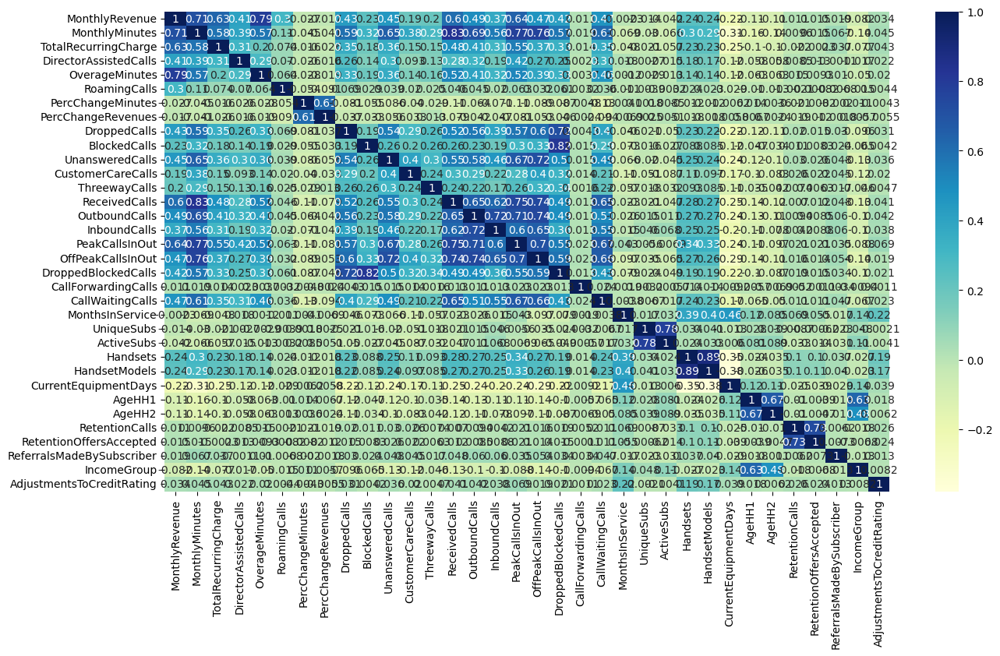

In [20]:
sns.heatmap(df.corr(), annot = True, cmap='YlGnBu')
plt.show()

- We can see that few columns are correlated with the other columns which means there is `Multicollinearity` in the data.
- `Droppedblockedcalls` and `Blockedcalls` have the maximum correlation.

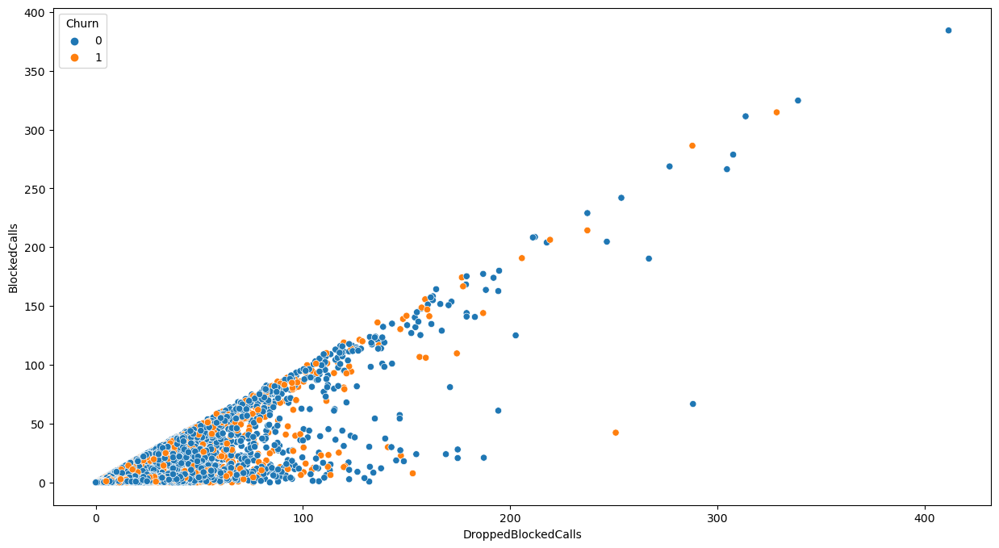

In [66]:
sns.scatterplot(data = df, x = 'DroppedBlockedCalls', y = 'BlockedCalls', hue = 'Churn')
plt.show()

- Just to view a positive correlation between DroppedBlockedCalls and BlockedCalls with hue as 'Churn'.

### Pairplot

In [62]:
sns.pairplot(df)
plt.show()

- A mixed of positive correlation, no correlation and negative correlations values are present.

### Analyze Categorical Variables

In [21]:
df_cat.describe()

,CustomerID,Churn,ServiceArea,ChildrenInHH,HandsetRefurbished,HandsetWebCapable,TruckOwner,RVOwner,Homeownership,BuysViaMailOrder,RespondsToMailOffers,OptOutMailings,NonUSTravel,OwnsComputer,HasCreditCard,NewCellphoneUser,NotNewCellphoneUser,OwnsMotorcycle,HandsetPrice,MadeCallToRetentionTeam,CreditRating,PrizmCode,Occupation,MaritalStatus
count,51047,51047,51047,51047,51047,51047,51047,51047,51047,51047,51047,51047,51047,51047,51047,51047,51047,51047,51047,51047,51047,51047,51047,51047
unique,51047,2,747,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,16,2,7,4,8,3
top,3000002,No,NYCBRO917,No,No,Yes,No,No,Known,No,No,No,No,No,Yes,No,No,No,Unknown,No,2-High,Other,Other,Unknown
freq,1,36336,1685,38679,43956,46046,41524,46894,33987,32596,31821,50295,48168,41583,34503,41223,44012,50368,28982,49302,18993,24655,37637,19700


In [22]:
df_cat_features = df_cat.drop(['CustomerID', 'ServiceArea'], axis=1)

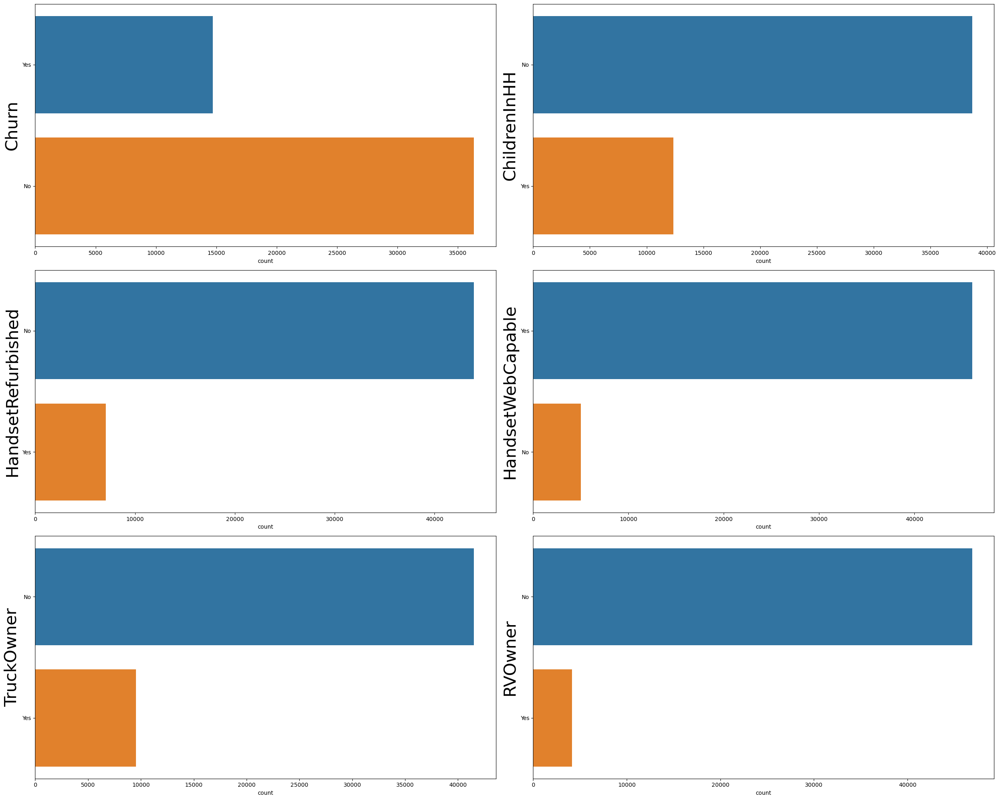

In [23]:
fig, ax = plt.subplots(3, 2, figsize=(25, 20))

for variable, subplot in zip(df_cat_features, ax.flatten()):
 
    countplot = sns.countplot(y=df_cat_features[variable], ax=subplot )
    countplot.set_ylabel(variable, fontsize = 30)
   
plt.tight_layout()   

# display the plot
plt.show()

- From the above Visualization, we can infer that there are more `No` than `Yes`, and that's why our target variable(churn) also has `No` as the majority class.

### Lets Analyze the target variable

In [24]:
df.Churn.value_counts()/df.Churn.count()*100

No    71.181460
Yes   28.818540
Name: Churn, dtype: float64

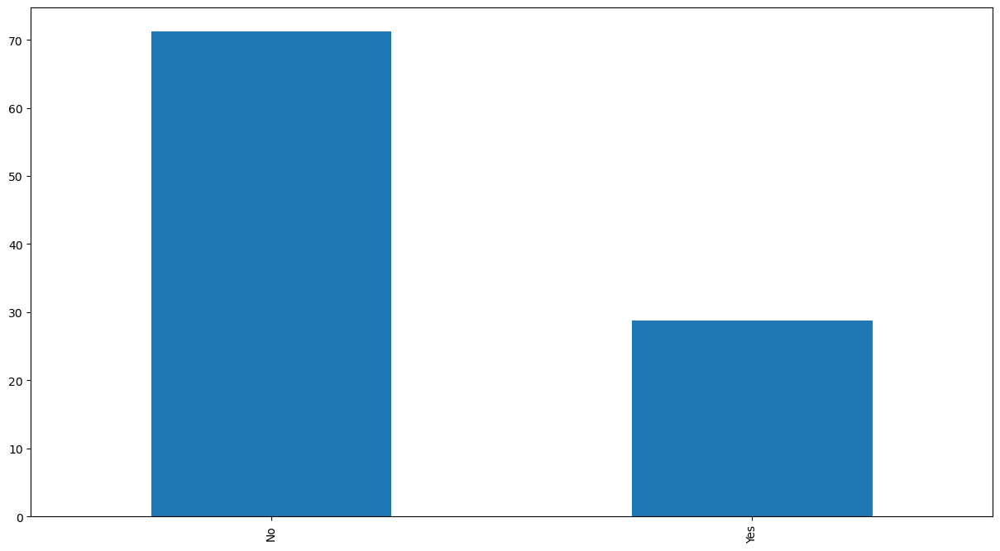

In [25]:
(df.Churn.value_counts()/df.Churn.count()*100).plot(kind = 'bar')
plt.show()

In [60]:
# There are more number of customers who dont churn than the customers who actually churn.

### Univariate Analysis

In [35]:
#Lets check the distribution of the variables.

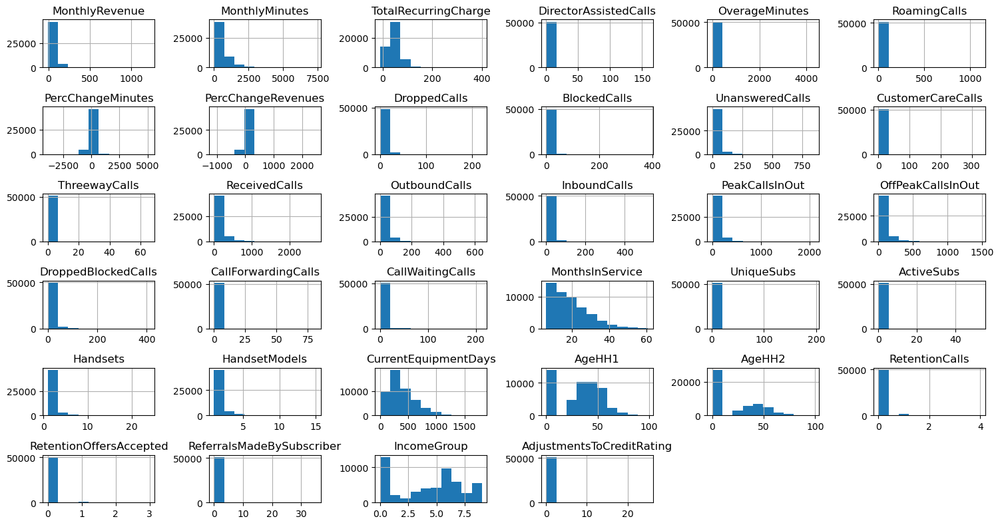

In [36]:
df.hist()
plt.tight_layout()

In [37]:
# We can see that most of them are right skewed.

df.skew()

CustomerID                  -0.009563
MonthlyRevenue               4.189224
MonthlyMinutes               2.199096
TotalRecurringCharge         1.632499
DirectorAssistedCalls       13.586024
OverageMinutes               8.124212
RoamingCalls                57.967352
PercChangeMinutes           -0.325975
PercChangeRevenues           7.913268
DroppedCalls                 4.549222
BlockedCalls                 9.790454
UnansweredCalls              4.381230
CustomerCareCalls           14.235913
ThreewayCalls               17.553060
ReceivedCalls                3.115673
OutboundCalls                3.525679
InboundCalls                 5.927980
PeakCallsInOut               3.327854
OffPeakCallsInOut            3.493146
DroppedBlockedCalls          5.522108
CallForwardingCalls         91.634791
CallWaitingCalls            11.121429
MonthsInService              1.056937
UniqueSubs                  79.635758
ActiveSubs                  10.647697
Handsets                     3.288712
HandsetModel

In [38]:
# UniqueSubs and Callforwardingcalls has the highest skewness.
# Only PerchangeMinutes follows a little bit of Normal Distribution.

### BiVariate Analysis

### Analyze relationship between target and categorical variables

In [26]:
df.CreditRating.value_counts()

2-High       18993
1-Highest     8522
3-Good        8410
5-Low         6499
4-Medium      5357
7-Lowest      2114
6-VeryLow     1152
Name: CreditRating, dtype: int64

In [27]:
df.MaritalStatus.value_counts()

Unknown    19700
Yes        18651
No         12696
Name: MaritalStatus, dtype: int64

<Axes: xlabel='CreditRating'>

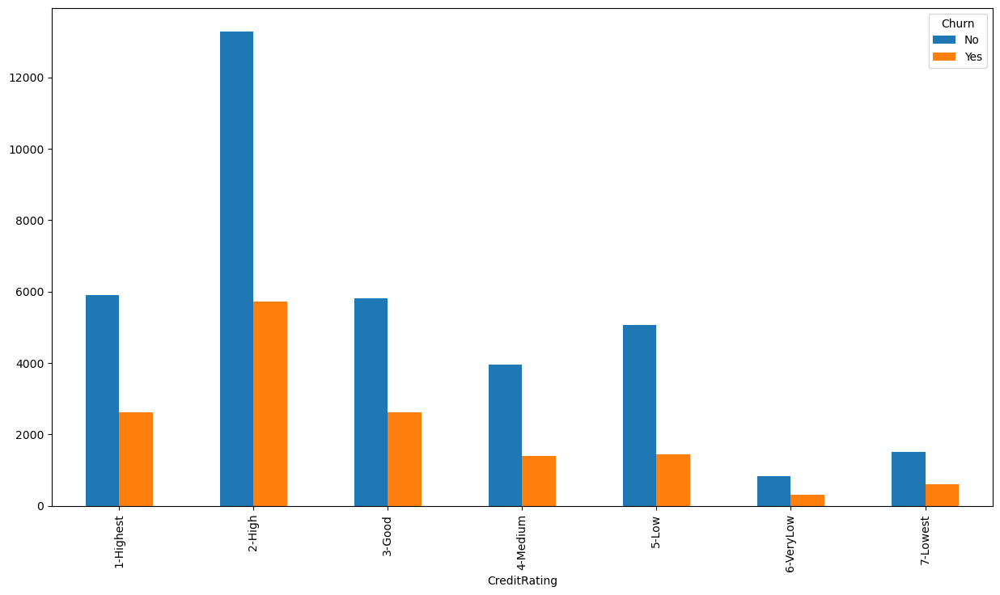

In [28]:
pd.crosstab(df.CreditRating, df.Churn).plot(kind = 'bar')

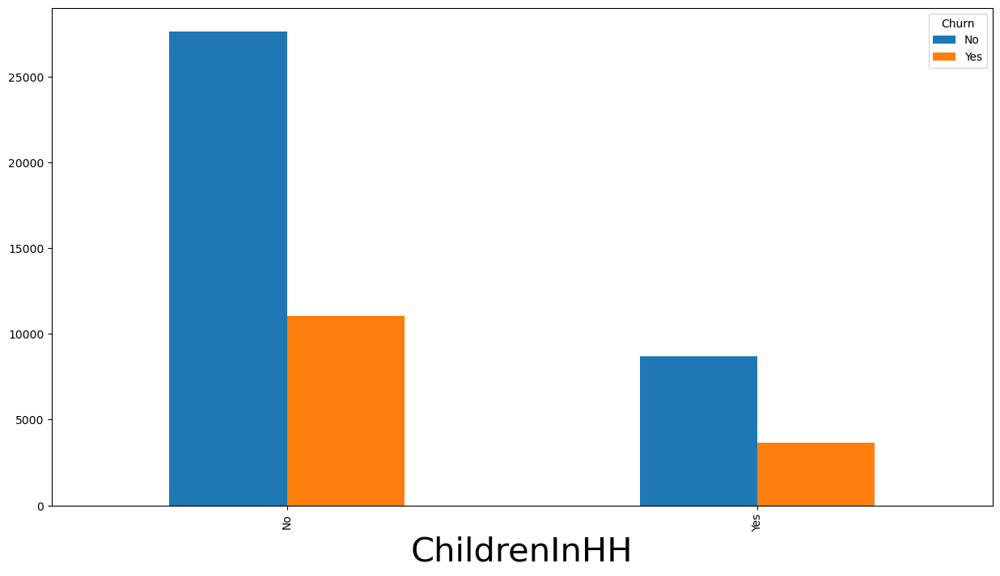

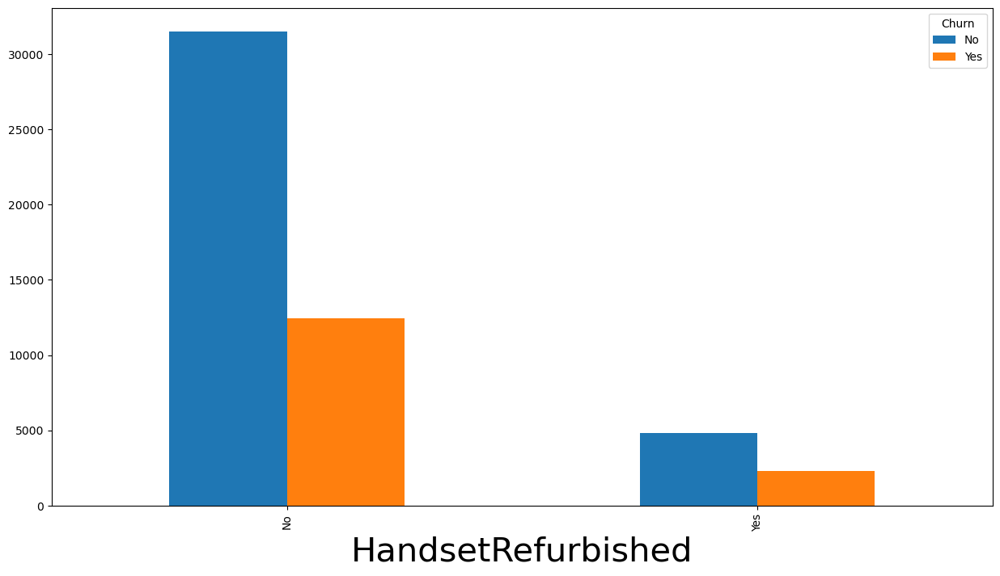

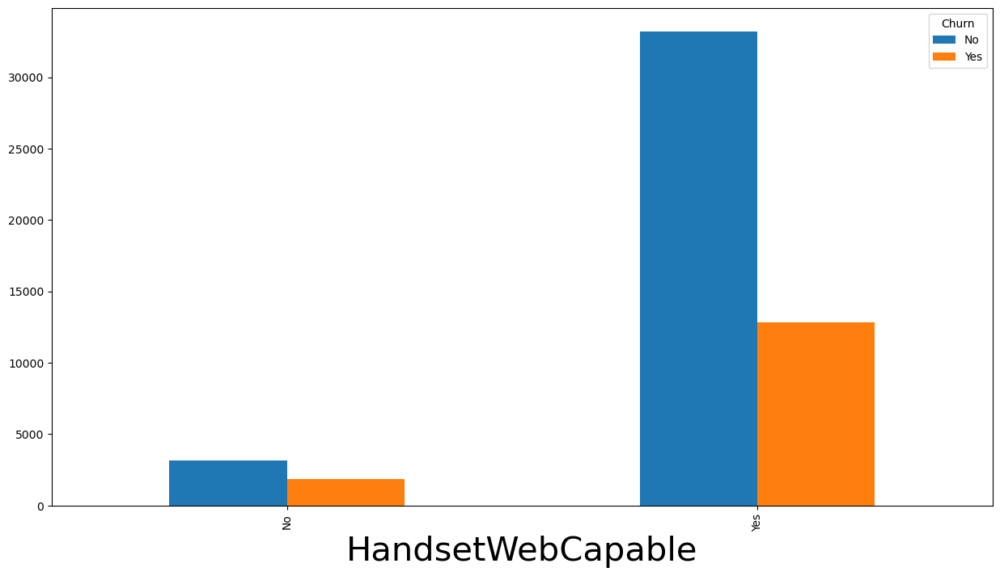

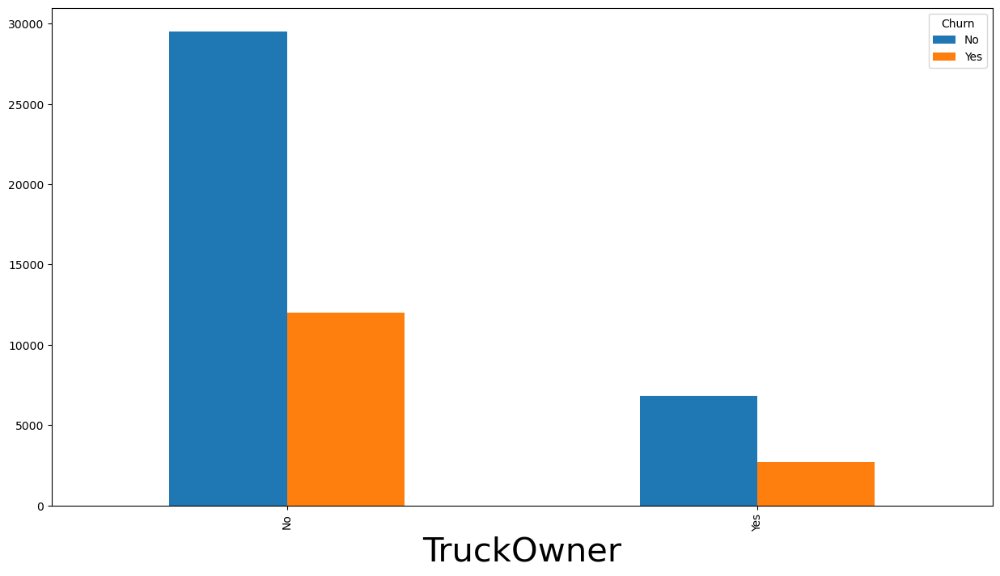

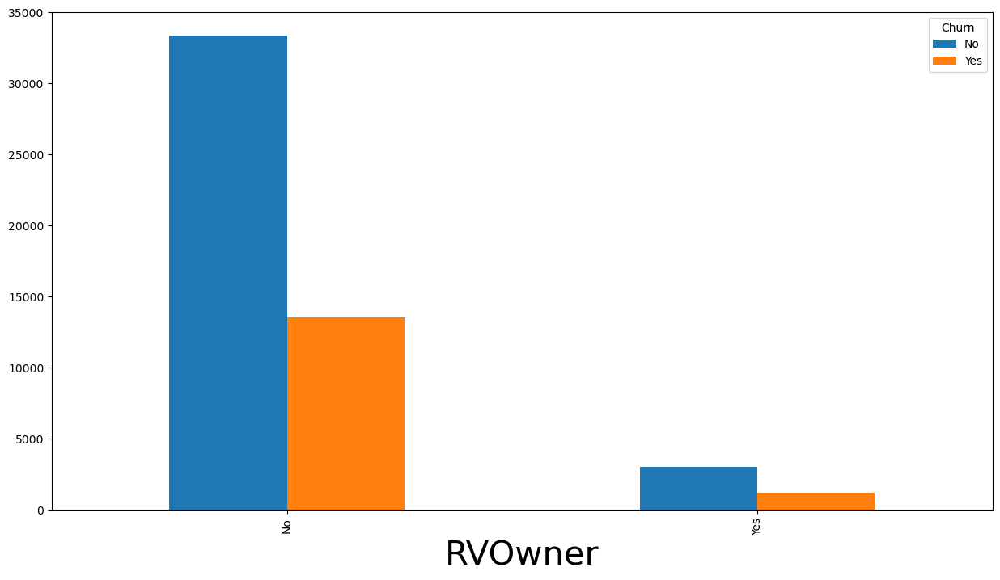

...

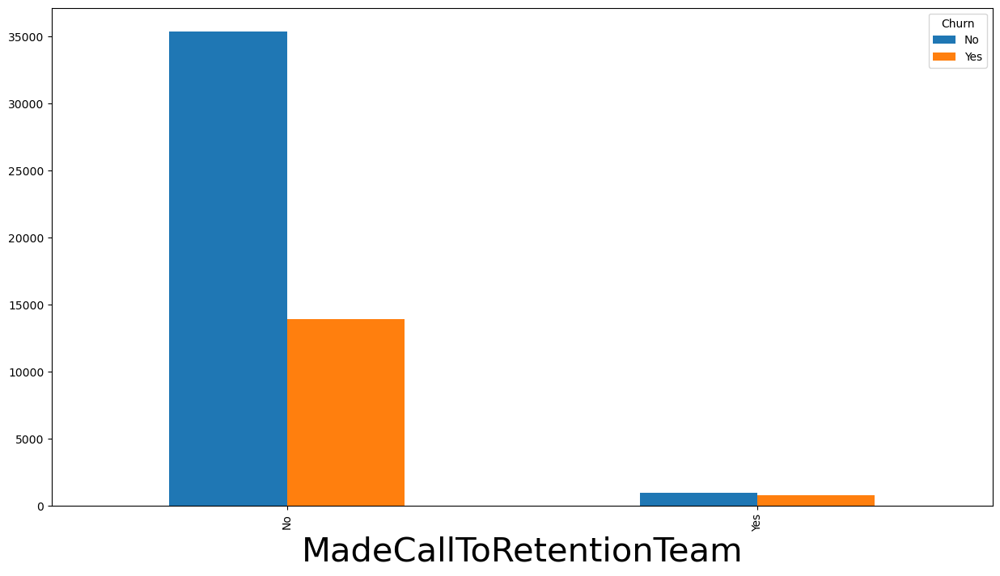

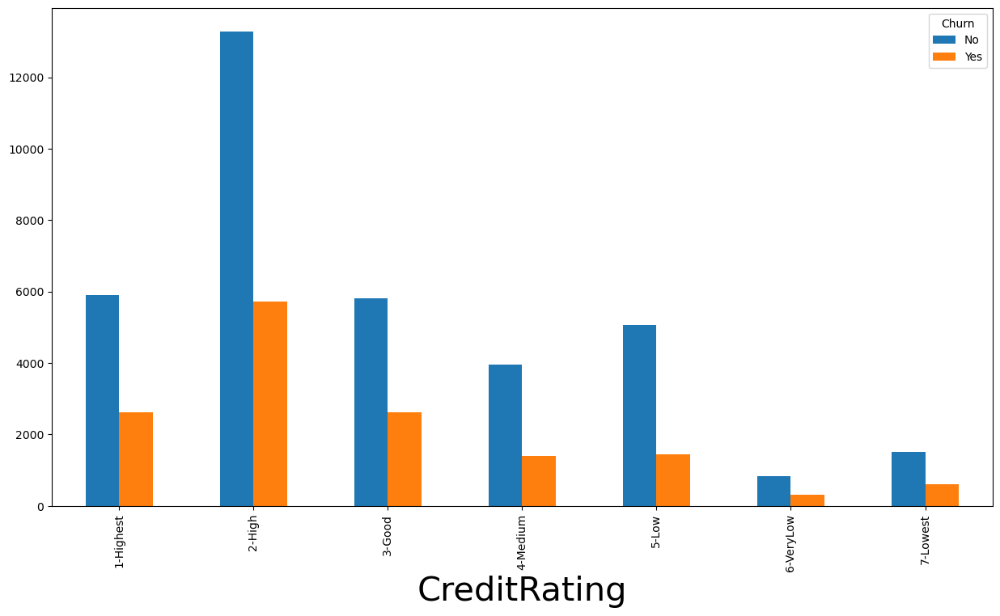

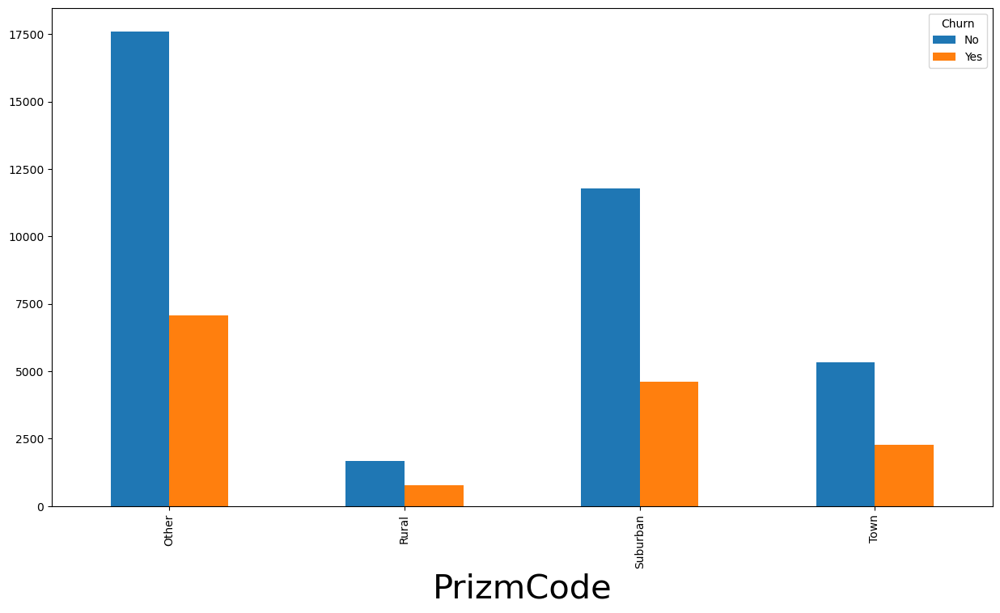

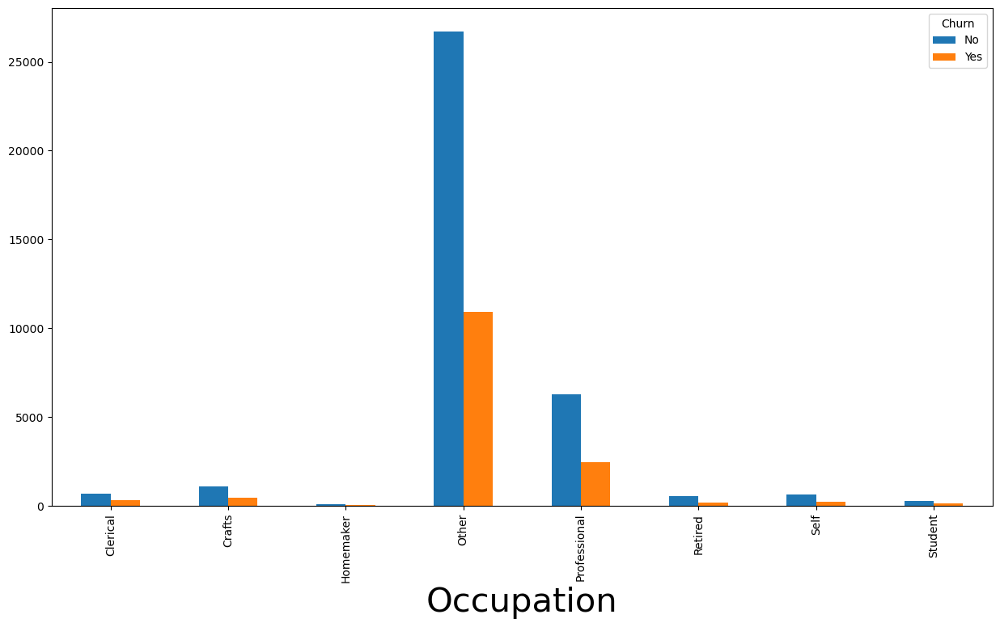

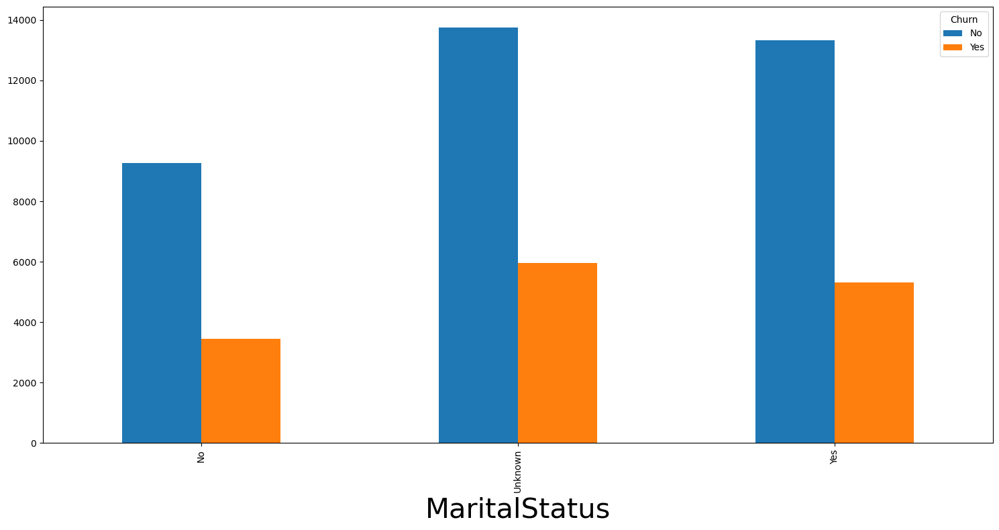

In [30]:
for variable in df_cat_features.drop('Churn', axis =1):
    crosstab = pd.crosstab(df[variable], df.Churn).plot(kind = 'bar')
    crosstab.set_xlabel(variable, fontsize = 30)

plt.tight_layout()   

plt.show() 

- Here we found some misclassification in the data. HandsetPrice has a value known as `Unknown` and also some numerical variables. It has been categorized as object, but in realtime its numeric. Its not a good practice to replace all these Unknown values with the mean/median value of the remaining variables. Instead, we can find out the distribution of these `Unknown` values and prefer to drop them.

In [31]:
df.HandsetPrice.value_counts()

Unknown    28982
30          7328
150         4115
130         2105
80          1960
10          1928
60          1776
200         1266
100         1235
40           249
400           46
250           20
300           13
180           10
500            8
240            6
Name: HandsetPrice, dtype: int64

In [32]:
#Almost 57% values are unknown, so we can drop them.

df.HandsetPrice.value_counts()[0]/df.shape[0]

0.5677512880286795

In [34]:
df.drop('HandsetPrice', axis =1, inplace = True)

**Interpretation**:

- When credit rating is high, there are chances of churning/not churning.
- Occupation - others, Prizmcode - others, Marital status - Unknown have the highest churn value.
- Also, We are going to drop this column HandsetPrice.

### Outliers

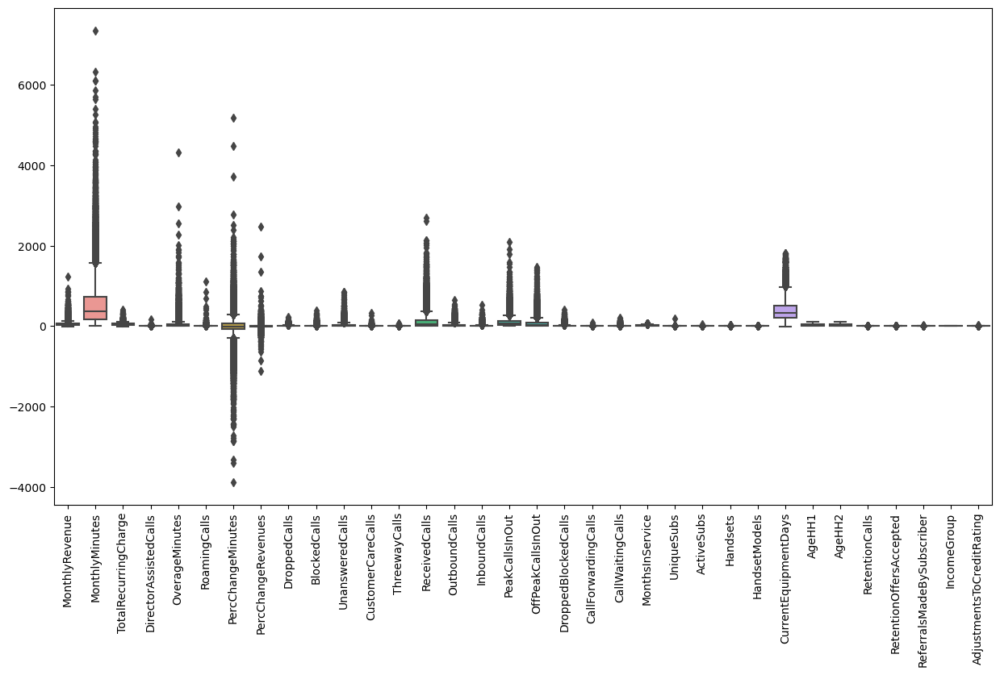

In [39]:
sns.boxplot(df_num)
plt.xticks(rotation = 90)
plt.show()

**Inference:**

- There are many outliers in the dataset.
- We are having a series of negative values in PerChangeMinutes and PercChangeRevenues, lets check whether these values are correct.

In [40]:
df.describe()

,MonthlyRevenue,MonthlyMinutes,TotalRecurringCharge,DirectorAssistedCalls,OverageMinutes,RoamingCalls,PercChangeMinutes,PercChangeRevenues,DroppedCalls,BlockedCalls,UnansweredCalls,CustomerCareCalls,ThreewayCalls,ReceivedCalls,OutboundCalls,InboundCalls,PeakCallsInOut,OffPeakCallsInOut,DroppedBlockedCalls,CallForwardingCalls,CallWaitingCalls,MonthsInService,UniqueSubs,ActiveSubs,Handsets,HandsetModels,CurrentEquipmentDays,AgeHH1,AgeHH2,RetentionCalls,RetentionOffersAccepted,ReferralsMadeBySubscriber,IncomeGroup,AdjustmentsToCreditRating
count,51047.000000,51047.000000,51047.000000,51047.000000,51047.000000,51047.000000,51047.000000,51047.000000,51047.000000,51047.000000,51047.000000,51047.000000,51047.000000,51047.000000,51047.000000,51047.000000,51047.000000,51047.000000,51047.000000,51047.000000,51047.000000,51047.000000,51047.000000,51047.000000,51047.000000,51047.000000,51047.000000,51047.000000,51047.000000,51047.000000,51047.000000,51047.000000,51047.000000,51047.000000
mean,58.802788,525.165514,46.824495,0.893257,39.914628,1.232466,-11.500833,-1.185572,6.011489,4.085672,28.288981,1.868999,0.298838,114.800121,25.377715,8.178104,90.549515,67.650790,10.158003,0.012277,1.840504,18.756264,1.532157,1.354340,1.805630,1.558740,380.544831,31.421141,20.767626,0.037201,0.018277,0.052070,4.324524,0.053911
std,44.442964,529.134170,23.812615,2.225423,96.462028,9.803517,256.587986,39.432467,9.043955,10.946905,38.876194,5.096138,1.168277,166.485896,35.209147,16.665878,104.947470,92.752699,15.555284,0.594168,5.585129,9.800138,1.223384,0.675477,1.331165,0.905927,253.799599,21.905705,23.881611,0.206483,0.142458,0.307592,3.138236,0.383147
min,-6.170000,0.000000,-11.000000,0.000000,0.000000,0.000000,-3875.000000,-1107.700000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,1.000000,0.000000,1.000000,1.000000,-5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,33.660000,159.000000,30.000000,0.000000,0.000000,0.000000,-82.000000,-6.900000,0.700000,0.000000,5.300000,0.000000,0.000000,8.300000,3.300000,0.000000,23.000000,11.000000,1.700000,0.000000,0.000000,11.000000,1.000000,1.000000,1.000000,1.000000,205.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,48.460000,366.000000,45.000000,0.250000,3.000000,0.000000,-5.000000,-0.300000,3.000000,1.000000,16.300000,0.000000,0.000000,52.800000,13.700000,2.000000,62.000000,35.700000,5.300000,0.000000,0.300000,16.000000,1.000000,1.000000,1.000000,1.000000,329.000000,36.000000,0.000000,0.000000,0.000000,0.000000,5.000000,0.000000
75%,70.960000,722.000000,60.000000,0.990000,40.000000,0.200000,65.000000,1.550000,7.700000,3.700000,36.300000,1.700000,0.300000,153.500000,34.000000,9.300000,121.300000,88.700000,12.300000,0.000000,1.300000,24.000000,2.000000,2.000000,2.000000,2.000000,515.000000,48.000000,42.000000,0.000000,0.000000,0.000000,7.000000,0.000000
max,1223.380000,7359.000000,400.000000,159.390000,4321.000000,1112.400000,5192.000000,2483.500000,221.700000,384.300000,848.700000,327.300000,66.000000,2692.400000,644.300000,519.300000,2090.700000,1474.700000,411.700000,81.300000,212.700000,61.000000,196.000000,53.000000,24.000000,15.000000,1812.000000,99.000000,99.000000,4.000000,3.000000,35.000000,9.000000,25.000000


In [41]:
df[df.PercChangeMinutes<0].shape

(27183, 57)

- There are almost 27183 values negative in PercChangeMinutes, Lets not drop this and continue our analysis, check our results and if something goes wrong then we can remove these negative values.

In [42]:
df[df.MonthlyRevenue<0]

,CustomerID,Churn,MonthlyRevenue,MonthlyMinutes,TotalRecurringCharge,DirectorAssistedCalls,OverageMinutes,RoamingCalls,PercChangeMinutes,PercChangeRevenues,DroppedCalls,BlockedCalls,UnansweredCalls,CustomerCareCalls,ThreewayCalls,ReceivedCalls,OutboundCalls,InboundCalls,PeakCallsInOut,OffPeakCallsInOut,DroppedBlockedCalls,CallForwardingCalls,CallWaitingCalls,MonthsInService,UniqueSubs,ActiveSubs,ServiceArea,Handsets,HandsetModels,CurrentEquipmentDays,AgeHH1,AgeHH2,ChildrenInHH,HandsetRefurbished,HandsetWebCapable,TruckOwner,RVOwner,Homeownership,BuysViaMailOrder,RespondsToMailOffers,OptOutMailings,NonUSTravel,OwnsComputer,HasCreditCard,RetentionCalls,RetentionOffersAccepted,NewCellphoneUser,NotNewCellphoneUser,ReferralsMadeBySubscriber,IncomeGroup,OwnsMotorcycle,AdjustmentsToCreditRating,MadeCallToRetentionTeam,CreditRating,PrizmCode,Occupation,MaritalStatus
26596,3210322,No,-2.520000,211.000000,0.000000,0.330000,0.000000,0.000000,-5.000000,-0.300000,0.000000,0.000000,7.300000,1.300000,0.000000,1.700000,8.000000,1.300000,12.700000,17.000000,0.000000,0.000000,0.000000,18,2,2,KCYKCK913,2.000000,2.000000,281.000000,0.000000,0.000000,No,Yes,Yes,No,No,Unknown,No,No,No,No,No,No,0,0,No,No,0,0,No,0,No,3-Good,Suburban,Other,Unknown
33352,3265738,No,-5.860000,0.000000,-5.000000,0.000000,0.000000,0.000000,0.000000,5.900000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,15,3,3,NEVLVS702,1.000000,1.000000,452.000000,34.000000,0.000000,No,No,Yes,No,No,Known,No,No,No,No,No,No,0,0,No,No,0,6,No,0,No,3-Good,Suburban,Other,Yes
48038,3378298,No,-6.170000,0.000000,-6.000000,0.000000,0.000000,0.000000,0.000000,6.200000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,7,1,1,NYCSUF516,1.000000,1.000000,203.000000,0.000000,0.000000,No,Yes,Yes,No,No,Known,No,No,No,No,No,No,0,0,Yes,No,0,6,No,0,No,7-Lowest,Suburban,Other,No


In [43]:
df[df.CurrentEquipmentDays<0].head(10)

,CustomerID,Churn,MonthlyRevenue,MonthlyMinutes,TotalRecurringCharge,DirectorAssistedCalls,OverageMinutes,RoamingCalls,PercChangeMinutes,PercChangeRevenues,DroppedCalls,BlockedCalls,UnansweredCalls,CustomerCareCalls,ThreewayCalls,ReceivedCalls,OutboundCalls,InboundCalls,PeakCallsInOut,OffPeakCallsInOut,DroppedBlockedCalls,CallForwardingCalls,CallWaitingCalls,MonthsInService,UniqueSubs,ActiveSubs,ServiceArea,Handsets,HandsetModels,CurrentEquipmentDays,AgeHH1,AgeHH2,ChildrenInHH,HandsetRefurbished,HandsetWebCapable,TruckOwner,RVOwner,Homeownership,BuysViaMailOrder,RespondsToMailOffers,OptOutMailings,NonUSTravel,OwnsComputer,HasCreditCard,RetentionCalls,RetentionOffersAccepted,NewCellphoneUser,NotNewCellphoneUser,ReferralsMadeBySubscriber,IncomeGroup,OwnsMotorcycle,AdjustmentsToCreditRating,MadeCallToRetentionTeam,CreditRating,PrizmCode,Occupation,MaritalStatus
107,3000762,Yes,180.220000,3559.000000,150.000000,11.380000,99.000000,0.000000,-149.000000,-11.400000,3.700000,31.000000,120.700000,0.000000,0.300000,1543.700000,26.700000,6.700000,725.300000,468.700000,34.700000,0.000000,60.700000,55,3,2,OKCLRK501,10.000000,5.000000,-3.000000,0.000000,0.000000,No,Yes,Yes,No,No,Unknown,No,No,No,No,No,No,0,0,No,Yes,0,0,No,0,No,3-Good,Other,Other,Unknown
424,3003242,No,36.340000,247.000000,30.000000,2.480000,7.000000,1.000000,154.000000,14.100000,2.700000,0.700000,21.300000,0.000000,0.000000,14.000000,22.700000,3.700000,68.000000,25.000000,3.300000,0.000000,0.000000,52,1,1,SEASEA206,4.000000,4.000000,-1.000000,62.000000,54.000000,No,No,Yes,No,No,Known,Yes,Yes,No,No,Yes,Yes,1,1,No,No,0,6,No,0,Yes,1-Highest,Town,Self,Yes
2107,3016538,No,95.350000,1254.000000,85.000000,0.000000,29.000000,0.000000,-380.000000,-14.100000,14.300000,0.000000,25.300000,3.300000,0.000000,660.400000,32.300000,14.700000,316.000000,121.700000,14.300000,0.000000,3.000000,40,2,2,NYCSUF516,5.000000,4.000000,-3.000000,46.000000,42.000000,Yes,No,Yes,Yes,Yes,Known,Yes,Yes,No,No,Yes,Yes,0,0,No,No,0,6,No,0,No,1-Highest,Other,Self,Yes
2145,3016766,No,88.980000,1.000000,50.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,40,1,1,SANCRP512,4.000000,3.000000,-1.000000,60.000000,30.000000,Yes,No,Yes,Yes,Yes,Known,Yes,Yes,No,No,No,Yes,0,0,No,No,0,6,No,2,No,6-VeryLow,Other,Professional,Unknown
3883,3030326,No,62.170000,839.000000,81.000000,0.250000,0.000000,0.000000,138.000000,-3.500000,4.700000,5.000000,46.000000,3.000000,0.300000,245.400000,21.700000,4.300000,245.000000,86.300000,9.700000,0.000000,9.000000,37,2,1,MIANDA305,8.000000,7.000000,-3.000000,0.000000,0.000000,No,No,Yes,No,No,Unknown,No,No,No,No,No,No,0,0,Yes,No,0,0,No,2,No,1-Highest,Other,Other,Unknown
3923,3030654,No,71.600000,560.000000,51.000000,0.500000,18.000000,4.000000,287.000000,56.900000,3.700000,0.000000,15.300000,0.000000,0.000000,160.300000,31.300000,3.000000,81.000000,48.700000,3.700000,0.000000,0.000000,37,2,1,SFRSFR415,3.000000,3.000000,-2.000000,50.000000,0.000000,No,No,Yes,No,No,Known,No,No,No,No,No,Yes,0,0,Yes,No,0,5,No,0,No,1-Highest,Other,Other,Unknown
4075,3031906,No,45.640000,296.000000,45.000000,9.900000,0.000000,0.000000,84.000000,12.400000,1.300000,3.000000,4.300000,0.000000,0.000000,20.200000,4.700000,2.300000,53.700000,11.000000,4.300000,0.000000,0.000000,36,1,1,HOUHOU281,7.000000,4.000000,-5.000000,40.000000,56.000000,No,No,Yes,Yes,No,Known,No,No,No,No,No,Yes,0,0,Yes,No,0,5,No,0,No,1-Highest,Other,Other,No
4318,3033854,No,36.520000,148.000000,45.000000,1.240000,0.000000,0.300000,-125.000000,-0.400000,0.000000,0.000000,8.300000,1.700000,0.000000,17.600000,4.300000,1.000000,39.700000,20.300000,0.000000,0.000000,0.300000,36,1,1,OHICOL614,5.000000,4.000000,-2.000000,28.000000,26.000000,No,Yes,Yes,Yes,Yes,Known,No,No,No,No,No,Yes,0,0,Yes,No,0,6,No,0,No,4-Medium,Town,Other,Yes
4319,3033858,No,125.190000,592.000000,87.000000,0.000000,8.000000,0.000000,0.000000,0.000000,0.000000,0.000000

In [44]:
# Basically checking the values which are less than 0(Negative values)

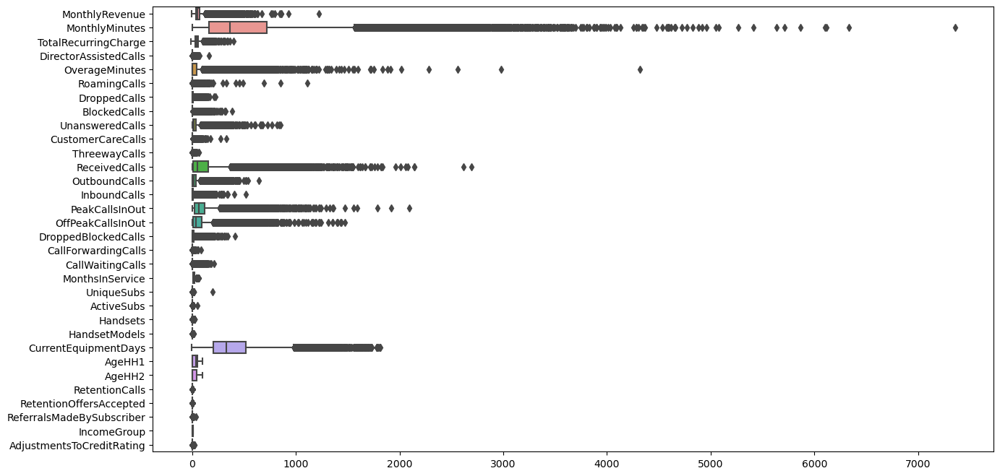

In [45]:
sns.boxplot(df_num.drop(['PercChangeMinutes', 'PercChangeRevenues'], axis =1), orient = 'h')
#plt.xticks(rotation = 90)
plt.show()

- There are many outliers in the data, We cannot simple drop the outliers using IQR or Z score method, we have to analyze each variable and check whether dropping the outliers make sense.

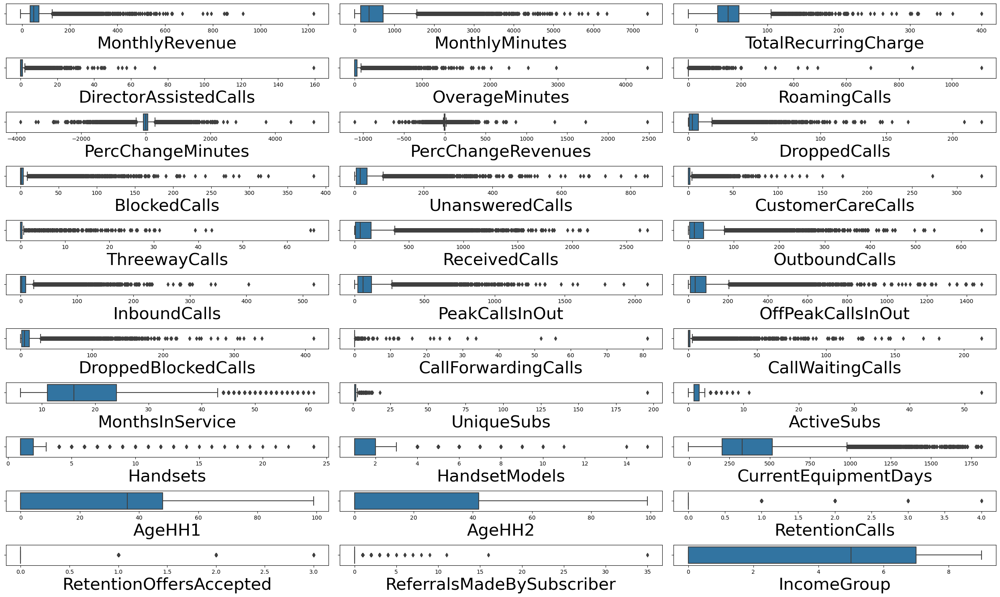

In [46]:
fig, ax = plt.subplots(11, 3, figsize=(25, 15))

for variable, subplot in zip(df_num, ax.flatten()):
    boxplt = sns.boxplot(x=variable,data=df_num, ax=subplot)
    boxplt.set_xlabel(variable, fontsize = 30)

plt.tight_layout()   
plt.show() 

In [47]:
# The above boxplots gives us a better understanding of the outliers.

In [48]:
#Lets convert the Churn values to 0 and 1.
df['Churn'].replace(to_replace='Yes', value=1, inplace=True)
df['Churn'].replace(to_replace='No',  value=0, inplace=True)

In [49]:
df.head()

,CustomerID,Churn,MonthlyRevenue,MonthlyMinutes,TotalRecurringCharge,DirectorAssistedCalls,OverageMinutes,RoamingCalls,PercChangeMinutes,PercChangeRevenues,DroppedCalls,BlockedCalls,UnansweredCalls,CustomerCareCalls,ThreewayCalls,ReceivedCalls,OutboundCalls,InboundCalls,PeakCallsInOut,OffPeakCallsInOut,DroppedBlockedCalls,CallForwardingCalls,CallWaitingCalls,MonthsInService,UniqueSubs,ActiveSubs,ServiceArea,Handsets,HandsetModels,CurrentEquipmentDays,AgeHH1,AgeHH2,ChildrenInHH,HandsetRefurbished,HandsetWebCapable,TruckOwner,RVOwner,Homeownership,BuysViaMailOrder,RespondsToMailOffers,OptOutMailings,NonUSTravel,OwnsComputer,HasCreditCard,RetentionCalls,RetentionOffersAccepted,NewCellphoneUser,NotNewCellphoneUser,ReferralsMadeBySubscriber,IncomeGroup,OwnsMotorcycle,AdjustmentsToCreditRating,MadeCallToRetentionTeam,CreditRating,PrizmCode,Occupation,MaritalStatus
0,3000002,1,24.000000,219.000000,22.000000,0.250000,0.000000,0.000000,-157.000000,-19.000000,0.700000,0.700000,6.300000,0.000000,0.000000,97.200000,0.000000,0.000000,58.000000,24.000000,1.300000,0.000000,0.300000,61,2,1,SEAPOR503,2.000000,2.000000,361.000000,62.000000,0.000000,No,No,Yes,No,No,Known,Yes,Yes,No,No,Yes,Yes,1,0,No,No,0,4,No,0,Yes,1-Highest,Suburban,Professional,No
1,3000010,1,16.990000,10.000000,17.000000,0.000000,0.000000,0.000000,-4.000000,0.000000,0.300000,0.000000,2.700000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,1.000000,0.300000,0.000000,0.000000,58,1,1,PITHOM412,2.000000,1.000000,1504.000000,40.000000,42.000000,Yes,No,No,No,No,Known,Yes,Yes,No,No,Yes,Yes,0,0,Yes,No,0,5,No,0,No,4-Medium,Suburban,Professional,Yes
2,3000014,0,38.000000,8.000000,38.000000,0.000000,0.000000,0.000000,-2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.400000,0.300000,0.000000,1.300000,3.700000,0.000000,0.000000,0.000000,60,1,1,MILMIL414,1.000000,1.000000,1812.000000,26.000000,26.000000,Yes,No,No,No,No,Unknown,No,No,No,No,No,Yes,0,0,Yes,No,0,6,No,0,No,3-Good,Town,Crafts,Yes
3,3000022,0,82.280000,1312.000000,75.000000,1.240000,0.000000,0.000000,157.000000,8.100000,52.000000,7.700000,76.000000,4.300000,1.300000,200.300000,370.300000,147.000000,555.700000,303.700000,59.700000,0.000000,22.700000,59,2,2,PITHOM412,9.000000,4.000000,458.000000,30.000000,0.000000,No,No,Yes,No,No,Known,Yes,Yes,No,No,No,Yes,0,0,Yes,No,0,6,No,0,No,4-Medium,Other,Other,No
4,3000026,1,17.140000,0.000000,17.000000,0.000000,0.000000,0.000000,0.000000,-0.200000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,53,2,2,OKCTUL918,4.000000,3.000000,852.000000,46.000000,54.000000,No,No,No,No,No,Known,Yes,Yes,No,No,Yes,Yes,0,0,No,Yes,0,9,No,1,No,1-Highest,Other,Professional,Yes


In [50]:
df.Churn = df.Churn.astype(int)

In [55]:
df.Churn.dtypes

dtype('int64')

**Summary:**

- These are the basic preprocessing steps that are done.
- In the next phase, we will be removing the outliers by analyzing all the data variables correctly.
- Doing feature engineering.
- Also other processing steps like encoding the categorical variables and scaling the numerical values.
- Since this is a classification problem, we will be building a Logistic Regression as the base model and then building a Random forest or any other high end algorithm.

- In this module, we have understood the relationship between the target variable and the categorical variables and also the distribution of Boxplot etc..
- In the early stage, where we have to replace the null values, we have used the median value, we can also drop the rows which are having null values, since a very small number of missing values are present in the data.